In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.animation as animation
from IPython.display import HTML
%matplotlib inline

In [2]:
corona_df = pd.read_csv('countries-aggregated.csv')
corona_df = corona_df.copy()
corona_df['Date'] =pd.to_datetime(corona_df['Date'])

In [3]:
corona_df.dtypes

Date         datetime64[ns]
Country              object
Confirmed             int64
Recovered             int64
Deaths                int64
dtype: object

In [4]:
corona_df

,Date,Country,Confirmed,Recovered,Deaths
0,2020-01-22,Afghanistan,0,0,0
1,2020-01-23,Afghanistan,0,0,0
2,2020-01-24,Afghanistan,0,0,0
3,2020-01-25,Afghanistan,0,0,0
4,2020-01-26,Afghanistan,0,0,0
...,...,...,...,...,...
91579,2021-05-08,Zimbabwe,38414,36052,1576
91580,2021-05-09,Zimbabwe,38419,36063,1576
91581,2021-05-10,Zimbabwe,38433,36208,1576
91582,2021-05-11,Zimbabwe,38448,36221,1579


In [5]:
corona_df = corona_df.groupby(['Date','Country'])[['Confirmed']].sum()
corona_df

Confirmed
Date       Country                      
2020-01-22 Afghanistan                 0
           Albania                     0
           Algeria                     0
           Andorra                     0
           Angola                      0
...                                  ...
2021-05-12 Vietnam                  3658
           West Bank and Gaza     303270
           Yemen                    6498
           Zambia                  92211
           Zimbabwe                38466

[91584 rows x 1 columns]

In [6]:
confirmed_series = corona_df.groupby(['Date'])['Confirmed'].nlargest(10).reset_index(level=1,drop=True)
confirmed_series.head(30) # This is basically a pandas series for confirmed, with multi index of country and date

Date        Country     
2020-01-22  China           548
            Thailand          4
            Japan             2
            Korea, South      1
            Taiwan*           1
            US                1
            Afghanistan       0
            Albania           0
            Algeria           0
            Andorra           0
2020-01-23  China           643
            Thailand          4
            Japan             2
            Vietnam           2
            Korea, South      1
            Singapore         1
            Taiwan*           1
            US                1
            Afghanistan       0
            Albania           0
2020-01-24  China           920
            Thailand          5
            Singapore         3
            Taiwan*           3
            France            2
            Japan             2
            Korea, South      2
            US                2
            Vietnam           2
            Afghanistan       0
Name: Confirmed

In [7]:
confirmed_series.index

MultiIndex([('2020-01-22',          'China'),
            ('2020-01-22',       'Thailand'),
            ('2020-01-22',          'Japan'),
            ('2020-01-22',   'Korea, South'),
            ('2020-01-22',        'Taiwan*'),
            ('2020-01-22',             'US'),
            ('2020-01-22',    'Afghanistan'),
            ('2020-01-22',        'Albania'),
            ('2020-01-22',        'Algeria'),
            ('2020-01-22',        'Andorra'),
            ...
            ('2021-05-12',             'US'),
            ('2021-05-12',          'India'),
            ('2021-05-12',         'Brazil'),
            ('2021-05-12',         'France'),
            ('2021-05-12',         'Turkey'),
            ('2021-05-12',         'Russia'),
            ('2021-05-12', 'United Kingdom'),
            ('2021-05-12',          'Italy'),
            ('2021-05-12',          'Spain'),
            ('2021-05-12',        'Germany')],
           names=['Date', 'Country'], length=4770)

In [8]:
# creating a list comprehension and converting it to set for unique values
countries_set = set([tuple_value[1] for tuple_value in confirmed_series.index ])
print(len(countries_set))
countries_set  

37


{'Afghanistan',
 'Albania',
 'Algeria',
 'Andorra',
 'Argentina',
 'Australia',
 'Bahrain',
 'Belgium',
 'Brazil',
 'Chile',
 'China',
 'Colombia',
 'Diamond Princess',
 'France',
 'Germany',
 'India',
 'Iran',
 'Italy',
 'Japan',
 'Korea, South',
 'Kuwait',
 'Malaysia',
 'Mexico',
 'Netherlands',
 'Peru',
 'Russia',
 'Singapore',
 'South Africa',
 'Spain',
 'Sweden',
 'Switzerland',
 'Taiwan*',
 'Thailand',
 'Turkey',
 'US',
 'United Kingdom',
 'Vietnam'}

In [9]:
countries = list(countries_set)
print(len(countries))
countries

37


['Spain',
 'Argentina',
 'Malaysia',
 'Australia',
 'Bahrain',
 'Switzerland',
 'Belgium',
 'Taiwan*',
 'Brazil',
 'China',
 'Russia',
 'US',
 'Turkey',
 'Vietnam',
 'Korea, South',
 'Diamond Princess',
 'Thailand',
 'South Africa',
 'Singapore',
 'United Kingdom',
 'Andorra',
 'Albania',
 'France',
 'Sweden',
 'Afghanistan',
 'Chile',
 'Algeria',
 'Germany',
 'Italy',
 'Kuwait',
 'India',
 'Mexico',
 'Peru',
 'Colombia',
 'Japan',
 'Netherlands',
 'Iran']

In [10]:
#Choosing a color for a country
cmap = plt.get_cmap('gist_ncar')
colors = cmap(np.linspace(0, 1, len(countries)))
color_dict = dict(zip(countries,colors))


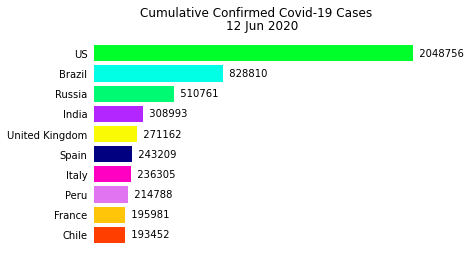

In [11]:
plt.figure()
date = pd.to_datetime('6/12/20',format="%m/%d/%y")
xvals = confirmed_series.loc[date].index
data = confirmed_series.loc[date].values
bars = plt.barh(xvals,data,color=[ color_dict[country] for country in xvals])
plt.suptitle('Cumulative Confirmed Covid-19 Cases')
plt.title(date.strftime("%d %b %Y"))
ax = plt.gca()
ax.invert_yaxis()
# Removing borders
for spine in ax.spines.values():
    spine.set_visible(False)
# Removing Tickmarks and values in X-axis
plt.tick_params(left=False, bottom=False, labelbottom=False)
# Labelling The bars directly
for bar in bars:
    ax.text(bar.get_width(), bar.get_y() + bar.get_height()/2, '  ' + str(bar.get_width()), va='center')

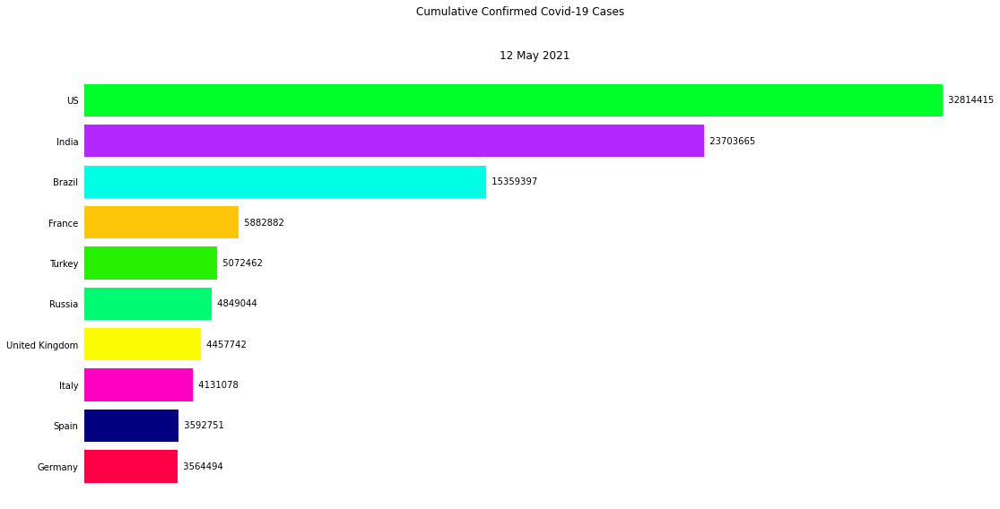

In [12]:
# Each uniuqe date we have in confirmed_series
dates = np.sort(np.unique(confirmed_series.index.get_level_values(level=0)))
n = len(dates)

def update(curr):
    if curr == n:
        # Last date we have in confirmed_series
        video.event_source.stop()
    plt.cla()
    date = dates[curr]
    xvals = confirmed_series.loc[date].index
    data = confirmed_series.loc[date].values
    bars = plt.barh(xvals,data,color=[ color_dict[country] for country in xvals])
    plt.suptitle('Cumulative Confirmed Covid-19 Cases')
    plt.title(pd.to_datetime(date).strftime("%d %b %Y"))
    ax = plt.gca()
    ax.invert_yaxis()
    # Removing borders
    for spine in ax.spines.values():
        spine.set_visible(False)
    # Removing Tickmarks and values in X-axis
    plt.tick_params(left=False, bottom=False, labelbottom=False)
    # Labelling The bars directly
    for bar in bars:
        ax.text(bar.get_width(), bar.get_y() + bar.get_height()/2, '  ' + str(bar.get_width()), va='center')
        
        
fig = plt.figure(figsize=[18,9]) #Adjusting margins
video = animation.FuncAnimation(fig, update, interval=100, frames=n,repeat=False)
video.save('covid_19_variation.mp4')
HTML(video.to_jshtml())